In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read the CSV file
df = all_features

# Select NDVI columns from 2015 onwards
ndvi_columns = [
    col for col in df.columns
    if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
]

# Melt the dataframe to long format for easier analysis
df_melted = df.melt(
    id_vars=['id', 'h3_address', 'geometry'],
    value_vars=ndvi_columns,
    var_name='season_year',
    value_name='ndvi'
)

# Extract season and year from the column name
df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
df_melted['year'] = df_melted['year'].astype(int)

# Seasonal Analysis
def seasonal_analysis(df):
    # Group by season and calculate statistics
    seasonal_stats = df.groupby('season')['ndvi'].agg([
        ('mean', 'mean'),
        ('median', 'median'),
        ('std', 'std'),
        ('min', 'min'),
        ('max', 'max')
    ])
    return seasonal_stats

# Trend Analysis
def trend_analysis(df):
    # Group by year and calculate mean NDVI
    yearly_trend = df.groupby('year')['ndvi'].mean()
    return yearly_trend

# Visualization Function
def visualize_ndvi(df):
    # Create a figure with multiple subplots
    fig, axs = plt.subplots(2, 2, figsize=(16, 12))

    # 1. Boxplot of NDVI by Season
    sns.boxplot(x='season', y='ndvi', data=df, ax=axs[0, 0])
    axs[0, 0].set_title('NDVI Distribution by Season')
    axs[0, 0].set_xlabel('Season')
    axs[0, 0].set_ylabel('NDVI Value')

    # 2. Yearly Trend Line
    yearly_trend = trend_analysis(df)
    yearly_trend.plot(ax=axs[0, 1], marker='o')
    axs[0, 1].set_title('Yearly NDVI Trend')
    axs[0, 1].set_xlabel('Year')
    axs[0, 1].set_ylabel('Mean NDVI')

    # 3. Heatmap of NDVI by Season and Year
    pivot_df = df.pivot_table(
        index='year',
        columns='season',
        values='ndvi',
        aggfunc='mean'
    )
    sns.heatmap(pivot_df, annot=True, cmap='YlGnBu', ax=axs[1, 0])
    axs[1, 0].set_title('NDVI Heatmap: Season vs Year')

    # 4. Violin Plot of NDVI Distribution
    sns.violinplot(x='season', y='ndvi', data=df, ax=axs[1, 1])
    axs[1, 1].set_title('NDVI Density by Season')
    axs[1, 1].set_xlabel('Season')
    axs[1, 1].set_ylabel('NDVI Value')

    plt.tight_layout()
    plt.show()

# Perform and print seasonal analysis
print("Seasonal NDVI Statistics:")
print(seasonal_analysis(df_melted))

# Perform and print trend analysis
print("\nYearly NDVI Trend:")
print(trend_analysis(df_melted))

# Visualize the data
visualize_ndvi(df_melted)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm

def load_and_preprocess_data(filepath):
    """
    Load and preprocess the NDVI data
    """
    # Read the CSV file
    df = all_features
    # Select NDVI columns from 2015 onwards
    ndvi_columns = [
        col for col in df.columns
        if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
    ]

    # Melt the dataframe to long format
    df_melted = df.melt(
        id_vars=['id', 'h3_address', 'geometry'],
        value_vars=ndvi_columns,
        var_name='season_year',
        value_name='ndvi'
    )

    # Extract season and year from the column name
    df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
    df_melted['year'] = df_melted['year'].astype(int)

    return df_melted

def comprehensive_trend_analysis(df):
    """
    Perform comprehensive trend analysis for each hexagon
    """
    # Trend analysis for each hexagon
    hexagon_trends = []

    # Unique hexagons
    hexagons = df['id'].unique()

    for hexagon in hexagons:
        # Filter data for specific hexagon
        hexagon_data = df[df['id'] == hexagon].sort_values('year')

        # Prepare data for trend analysis
        X = hexagon_data['year']
        y = hexagon_data['ndvi']

        # Ordinary Least Squares (OLS) Regression
        X = sm.add_constant(X)
        model = sm.OLS(y, X).fit()

        # Store trend information
        hexagon_trends.append({
            'id': hexagon,
            'slope': model.params[1],  # Slope of the trend line
            'p_value': model.pvalues[1],  # P-value for the slope
            'r_squared': model.rsquared,
            'mean_ndvi': y.mean(),
            'ndvi_change_percent': (model.params[1] / y.mean()) * 100  # Relative change
        })

    # Convert to DataFrame for easier analysis
    trends_df = pd.DataFrame(hexagon_trends)

    return trends_df

def visualize_trend_analysis(trends_df):
    """
    Visualize the trend analysis results
    """
    plt.figure(figsize=(20, 10))

    # 1. Distribution of Slopes
    plt.subplot(2, 3, 1)
    sns.histplot(trends_df['slope'], kde=True)
    plt.title('Distribution of NDVI Trend Slopes')
    plt.xlabel('Slope')
    plt.ylabel('Frequency')

    # 2. Scatter of Slope vs R-squared
    plt.subplot(2, 3, 2)
    plt.scatter(trends_df['slope'], trends_df['r_squared'], alpha=0.6)
    plt.title('Slope vs R-squared')
    plt.xlabel('Slope')
    plt.ylabel('R-squared')

    # 3. Boxplot of Relative NDVI Change
    plt.subplot(2, 3, 3)
    sns.boxplot(x=trends_df['ndvi_change_percent'])
    plt.title('Relative NDVI Change (%)')
    plt.xlabel('Percent Change')

    # 4. Significant Trends Pie Chart
    plt.subplot(2, 3, 4)
    significant_trends = trends_df[trends_df['p_value'] < 0.05]
    trend_types = {
        'Significant Increase': len(significant_trends[significant_trends['slope'] > 0]),
        'Significant Decrease': len(significant_trends[significant_trends['slope'] < 0]),
        'No Significant Trend': len(trends_df) - len(significant_trends)
    }
    plt.pie(trend_types.values(), labels=trend_types.keys(), autopct='%1.1f%%')
    plt.title('Trend Significance')

    # 5. Cumulative Distribution of Slopes
    plt.subplot(2, 3, 5)
    trends_df['slope'].plot(kind='hist', cumulative=True, density=1, bins=50)
    plt.title('Cumulative Distribution of Slopes')
    plt.xlabel('Slope')
    plt.ylabel('Cumulative Density')

    # 6. Statistical Summary of Trends
    plt.subplot(2, 3, 6)
    trend_summary = trends_df[['slope', 'p_value', 'r_squared', 'ndvi_change_percent']].describe()
    plt.axis('off')
    plt.table(cellText=trend_summary.round(4).values,
              colLabels=trend_summary.columns,
              rowLabels=trend_summary.index,
              cellLoc='center',
              loc='center')
    plt.title('Trend Analysis Summary')

    plt.tight_layout()
    plt.show()

    return trend_types

def seasonal_trend_analysis(df):
    """
    Analyze NDVI trends by season
    """
    seasonal_trends = df.groupby(['season', 'year'])['ndvi'].mean().reset_index()

    plt.figure(figsize=(15, 6))

    # Line plot of seasonal trends
    sns.lineplot(data=seasonal_trends, x='year', y='ndvi', hue='season')
    plt.title('Seasonal NDVI Trends')
    plt.xlabel('Year')
    plt.ylabel('Mean NDVI')
    plt.show()

    # ANOVA to check if seasonal differences are significant
    seasons = seasonal_trends['season'].unique()
    season_groups = [seasonal_trends[seasonal_trends['season'] == season]['ndvi'] for season in seasons]
    f_statistic, p_value = stats.f_oneway(*season_groups)

    print("\nSeasonal NDVI Differences:")
    print(f"ANOVA F-statistic: {f_statistic}")
    print(f"P-value: {p_value}")

    return seasonal_trends

def main(filepath):
    # Load and preprocess data
    df_melted = load_and_preprocess_data(filepath)

    # Comprehensive trend analysis
    trends_df = comprehensive_trend_analysis(df_melted)

    # Visualize trend analysis
    trend_types = visualize_trend_analysis(trends_df)

    # Seasonal trend analysis
    seasonal_trends = seasonal_trend_analysis(df_melted)

    # Save results
    #trends_df.to_csv('ndvi_hexagon_trends.csv', index=False)
    #seasonal_trends.to_csv('ndvi_seasonal_trends.csv', index=False)

    # Print summary of trend analysis
    print("\nTrend Analysis Summary:")
    for trend, count in trend_types.items():
        print(f"{trend}: {count} hexagons")

    # Detailed statistical analysis
    print("\nDetailed Trend Statistics:")
    print(trends_df[['slope', 'p_value', 'r_squared', 'ndvi_change_percent']].describe())

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm

def load_and_preprocess_data(filepath):
    """
    Load and preprocess the NDVI data
    """
    # Read the CSV file
    df = all_features

    # Select NDVI columns from 2015 onwards
    ndvi_columns = [
        col for col in df.columns
        if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
    ]

    # Melt the dataframe to long format
    df_melted = df.melt(
        id_vars=['id', 'h3_address', 'geometry'],
        value_vars=ndvi_columns,
        var_name='season_year',
        value_name='ndvi'
    )

    # Extract season and year from the column name
    df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
    df_melted['year'] = df_melted['year'].astype(int)

    return df_melted

def comprehensive_trend_analysis(df):
    """
    Perform comprehensive trend analysis for each hexagon
    """
    # Trend analysis for each hexagon
    hexagon_trends = []

    # Unique hexagons
    hexagons = df['id'].unique()

    for hexagon in hexagons:
        # Filter data for specific hexagon
        hexagon_data = df[df['id'] == hexagon].sort_values('year')

        # Prepare data for trend analysis
        X = hexagon_data['year']
        y = hexagon_data['ndvi']

        # Ordinary Least Squares (OLS) Regression
        X = sm.add_constant(X)
        model = sm.OLS(y, X).fit()

        # Store trend information
        hexagon_trends.append({
            'id': hexagon,
            'slope': model.params[1],  # Slope of the trend line
            'p_value': model.pvalues[1],  # P-value for the slope
            'r_squared': model.rsquared,
            'mean_ndvi': y.mean(),
            'ndvi_change_percent': (model.params[1] / y.mean()) * 100  # Relative change
        })

    # Convert to DataFrame for easier analysis
    trends_df = pd.DataFrame(hexagon_trends)

    return trends_df

def visualize_trend_analysis(trends_df):
    """
    Visualize the trend analysis results
    """
    plt.figure(figsize=(20, 10))

    # 1. Distribution of Slopes
    plt.subplot(2, 3, 1)
    sns.histplot(trends_df['slope'], kde=True)
    plt.title('Distribution of NDVI Trend Slopes')
    plt.xlabel('Slope')
    plt.ylabel('Frequency')

    # 2. Scatter of Slope vs R-squared
    plt.subplot(2, 3, 2)
    plt.scatter(trends_df['slope'], trends_df['r_squared'], alpha=0.6)
    plt.title('Slope vs R-squared')
    plt.xlabel('Slope')
    plt.ylabel('R-squared')

    # 3. Boxplot of Relative NDVI Change
    plt.subplot(2, 3, 3)
    sns.boxplot(x=trends_df['ndvi_change_percent'])
    plt.title('Relative NDVI Change (%)')
    plt.xlabel('Percent Change')

    # 4. Significant Trends Pie Chart
    plt.subplot(2, 3, 4)
    significant_trends = trends_df[trends_df['p_value'] < 0.05]
    trend_types = {
        'Significant Increase': len(significant_trends[significant_trends['slope'] > 0]),
        'Significant Decrease': len(significant_trends[significant_trends['slope'] < 0]),
        'No Significant Trend': len(trends_df) - len(significant_trends)
    }
    plt.pie(trend_types.values(), labels=trend_types.keys(), autopct='%1.1f%%')
    plt.title('Trend Significance')

    # 5. Cumulative Distribution of Slopes
    plt.subplot(2, 3, 5)
    trends_df['slope'].plot(kind='hist', cumulative=True, density=1, bins=50)
    plt.title('Cumulative Distribution of Slopes')
    plt.xlabel('Slope')
    plt.ylabel('Cumulative Density')

    # 6. Statistical Summary of Trends
    plt.subplot(2, 3, 6)
    trend_summary = trends_df[['slope', 'p_value', 'r_squared', 'ndvi_change_percent']].describe()
    plt.axis('off')
    plt.table(cellText=trend_summary.round(4).values,
              colLabels=trend_summary.columns,
              rowLabels=trend_summary.index,
              cellLoc='center',
              loc='center')
    plt.title('Trend Analysis Summary')

    plt.tight_layout()
    plt.show()

    return trend_types

def seasonal_trend_analysis(df):
    """
    Analyze NDVI trends by season
    """
    seasonal_trends = df.groupby(['season', 'year'])['ndvi'].mean().reset_index()

    plt.figure(figsize=(15, 6))

    # Line plot of seasonal trends
    sns.lineplot(data=seasonal_trends, x='year', y='ndvi', hue='season')
    plt.title('Seasonal NDVI Trends')
    plt.xlabel('Year')
    plt.ylabel('Mean NDVI')
    plt.show()

    # ANOVA to check if seasonal differences are significant
    seasons = seasonal_trends['season'].unique()
    season_groups = [seasonal_trends[seasonal_trends['season'] == season]['ndvi'] for season in seasons]
    f_statistic, p_value = stats.f_oneway(*season_groups)

    print("\nSeasonal NDVI Differences:")
    print(f"ANOVA F-statistic: {f_statistic}")
    print(f"P-value: {p_value}")

    return seasonal_trends

def main(filepath):
    # Load and preprocess data
    df_melted = load_and_preprocess_data(filepath)

    # Comprehensive trend analysis
    trends_df = comprehensive_trend_analysis(df_melted)

    # Visualize trend analysis
    trend_types = visualize_trend_analysis(trends_df)

    # Seasonal trend analysis
    seasonal_trends = seasonal_trend_analysis(df_melted)

    # Save results
    #trends_df.to_csv('ndvi_hexagon_trends.csv', index=False)
    #seasonal_trends.to_csv('ndvi_seasonal_trends.csv', index=False)

    # Print summary of trend analysis
    print("\nTrend Analysis Summary:")
    for trend, count in trend_types.items():
        print(f"{trend}: {count} hexagons")

    # Detailed statistical analysis
    print("\nDetailed Trend Statistics:")
    print(trends_df[['slope', 'p_value', 'r_squared', 'ndvi_change_percent']].describe())

# Run the analysis
# Replace 'your_input_file.csv' with your actual file path
main('your_input_file.csv')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

def load_and_preprocess_data(filepath):
    """
    Load and preprocess the NDVI data for time series analysis
    """
    # Read the CSV file
    df = all_features

    # Select NDVI columns from 2015 onwards
    ndvi_columns = [
        col for col in df.columns
        if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
    ]

    # Melt the dataframe to long format
    df_melted = df.melt(
        id_vars=['id', 'h3_address', 'geometry'],
        value_vars=ndvi_columns,
        var_name='season_year',
        value_name='ndvi'
    )

    # Extract season and year from the column name
    df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
    df_melted['year'] = df_melted['year'].astype(int)

    # Create a datetime column for time series analysis
    df_melted['date'] = pd.to_datetime(
        df_melted['year'].astype(str) + '-' +
        df_melted['quarter'].map({
            'Q1': '03-15',  # Summer (Southern Hemisphere)
            'Q2': '06-15',  # Fall
            'Q3': '09-15',  # Winter
            'Q4': '12-15'   # Spring
        })
    )

    return df_melted

def seasonal_decomposition_analysis(df):
    """
    Perform seasonal decomposition analysis for each hexagon
    """
    # Unique hexagons
    hexagons = df['id'].unique()

    # Prepare figure for decomposition plots
    plt.figure(figsize=(20, 4 * len(hexagons)))

    # Store decomposition results
    decomposition_results = {}

    for i, hexagon in enumerate(hexagons[:5]):  # Limit to first 5 hexagons for demonstration
        # Filter data for specific hexagon
        hexagon_data = df[df['id'] == hexagon].sort_values('date')

        # Prepare time series data
        ts = hexagon_data.groupby('date')['ndvi'].mean()

        try:
            # Perform seasonal decomposition
            decomposition = seasonal_decompose(ts, period=4)  # 4 seasons per year

            # Store results
            decomposition_results[hexagon] = decomposition

            # Plot decomposition
            plt.subplot(len(hexagons), 4, i*4 + 1)
            decomposition.observed.plot(ax=plt.gca(), title=f'Hexagon {hexagon}: Observed')

            plt.subplot(len(hexagons), 4, i*4 + 2)
            decomposition.trend.plot(ax=plt.gca(), title='Trend')

            plt.subplot(len(hexagons), 4, i*4 + 3)
            decomposition.seasonal.plot(ax=plt.gca(), title='Seasonal')

            plt.subplot(len(hexagons), 4, i*4 + 4)
            decomposition.resid.plot(ax=plt.gca(), title='Residuals')

        except Exception as e:
            print(f"Error decomposing hexagon {hexagon}: {e}")

    plt.tight_layout()
    plt.show()

    return decomposition_results

def advanced_seasonal_analysis(df):
    """
    Advanced seasonal analysis with statistical tests
    """
    # Seasonal statistics
    seasonal_stats = df.groupby('season')['ndvi'].agg([
        ('mean', 'mean'),
        ('median', 'median'),
        ('std', 'std'),
        ('min', 'min'),
        ('max', 'max')
    ])

    # ANOVA test for seasonal differences
    seasons = df['season'].unique()
    season_groups = [df[df['season'] == season]['ndvi'] for season in seasons]
    f_statistic, p_value = stats.f_oneway(*season_groups)

    # Visualize seasonal distribution
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='season', y='ndvi', data=df)
    plt.title('NDVI Distribution by Season')
    plt.show()

    # Print results
    print("\nSeasonal NDVI Statistics:")
    print(seasonal_stats)

    print("\nSeasonal Difference ANOVA Test:")
    print(f"F-statistic: {f_statistic}")
    print(f"P-value: {p_value}")

    # Pairwise t-tests between seasons
    print("\nPairwise Season Comparisons:")
    for i in range(len(seasons)):
        for j in range(i+1, len(seasons)):
            t_stat, p_val = stats.ttest_ind(
                df[df['season'] == seasons[i]]['ndvi'],
                df[df['season'] == seasons[j]]['ndvi']
            )
            print(f"{seasons[i]} vs {seasons[j]}:")
            print(f"  t-statistic: {t_stat}")
            print(f"  p-value: {p_val}")

    return seasonal_stats

def main(filepath):
    # Load and preprocess data
    df_melted = load_and_preprocess_data(filepath)

    # Seasonal decomposition analysis
    decomposition_results = seasonal_decomposition_analysis(df_melted)

    # Advanced seasonal analysis
    seasonal_stats = advanced_seasonal_analysis(df_melted)

    # Save seasonal statistics
    seasonal_stats.to_csv('ndvi_seasonal_statistics.csv')

    # Optional: Detailed hexagon-level decomposition summary
    def summarize_decomposition(decomp):
        return {
            'trend_mean': decomp.trend.mean(),
            'trend_std': decomp.trend.std(),
            'seasonal_mean': decomp.seasonal.mean(),
            'seasonal_std': decomp.seasonal.std(),
            'residual_mean': decomp.resid.mean(),
            'residual_std': decomp.resid.std()
        }

    decomp_summary = {hex: summarize_decomposition(decomp)
                      for hex, decomp in decomposition_results.items()}

    decomp_df = pd.DataFrame.from_dict(decomp_summary, orient='index')
    #decomp_df.to_csv('ndvi_decomposition_summary.csv')

    return df_melted, decomposition_results

# Run the analysis
# Replace 'your_input_file.csv' with your actual file path
main('your_input_file.csv')

In [3]:
import geopandas as gpd
import pandas as pd
import numpy as np
import folium
import branca.colormap as cm
import json

def load_and_process_data(filepath):
    """
    Load and process the NDVI data from GeoJSON
    """
    # Read the GeoJSON file
    gdf = gpd.read_file(filepath)

    # Select NDVI columns from 2015 onwards
    ndvi_columns = [
        col for col in gdf.columns
        if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
    ]

    # Melt the dataframe to long format
    df_melted = gdf.drop(columns='geometry').melt(
        id_vars=['id', 'h3_address'],
        value_vars=ndvi_columns,
        var_name='season_year',
        value_name='ndvi'
    )

    # Extract season and year from the column name
    df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
    df_melted['year'] = df_melted['year'].astype(int)

    # Perform trend analysis
    def calculate_trend(group):
        from scipy import stats
        if len(group) < 2:
            return pd.Series({
                'slope': 0,
                'p_value': 1,
                'r_squared': 0
            })
        slope, intercept, r_value, p_value, std_err = stats.linregress(group['year'], group['ndvi'])
        return pd.Series({
            'slope': slope,
            'p_value': p_value,
            'r_squared': r_value**2
        })

    # Group by id and calculate trend
    trends = df_melted.groupby('id').apply(calculate_trend).reset_index()

    # Merge trends back to geodataframe
    gdf = gdf.merge(trends, on='id')

    return gdf

def create_interactive_map(gdf):
    """
    Create an interactive map showing NDVI trends for hexagons
    """
    # Calculate the center of the map
    center = gdf.geometry.centroid.unary_union.centroid

    # Create a map
    m = folium.Map(location=[center.y, center.x], zoom_start=10)

    # Create a custom colormap for slopes
    def get_color(slope):
        # Create a colormap from red (negative) to white (neutral) to green (positive)
        colormap = cm.LinearColormap(
            colors=['red', 'white', 'green'],
            vmin=gdf['slope'].min(),
            vmax=gdf['slope'].max()
        )
        return colormap(slope)

    # Add base map layers
    folium.TileLayer('openstreetmap', name='OpenStreetMap').add_to(m)
    folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                     attr='Esri',
                     name='Satellite',
                     overlay=False,
                     control=True).add_to(m)

    # Unique seasons from the original columns
    seasons = [col.split('_')[1] for col in gdf.columns if col.startswith('Q') and len(col.split('_')) > 1]
    seasons = list(set(seasons))

    # Function to create layer for each season
    def create_season_layer(season):
        layer = folium.FeatureGroup(name=f'{season} NDVI Trends')

        for idx, row in gdf.iterrows():
            # Create a GeoJSON for each hexagon
            geo_json = folium.GeoJson(
                row.geometry.__geo_interface__,
                style_function=lambda x, row=row: {
                    'fillColor': get_color(row['slope']),
                    'color': 'black',
                    'weight': 2,
                    'fillOpacity': 0.7
                },
                tooltip=folium.Tooltip(f"""
                    Hexagon ID: {row['id']}<br>
                    H3 Address: {row['h3_address']}<br>
                    NDVI Slope: {row['slope']:.4f}<br>
                    P-value: {row['p_value']:.4f}<br>
                    R-squared: {row['r_squared']:.4f}
                """)
            )
            geo_json.add_to(layer)

        layer.add_to(m)

    # Create layers for each season
    for season in seasons:
        create_season_layer(season)

    # Add colormap legend
    colormap = cm.LinearColormap(
        colors=['red', 'white', 'green'],
        vmin=gdf['slope'].min(),
        vmax=gdf['slope'].max()
    )
    colormap.caption = 'NDVI Trend Slope'
    colormap.add_to(m)

    # Add layer control
    folium.LayerControl().add_to(m)

    # Save the map
    m.save('ndvi_trends_map.html')

    return m

def main(filepath):
    # Load and process data
    gdf = load_and_process_data(filepath)

    # Create interactive map
    map_obj = create_interactive_map(gdf)

    # Save additional data for reference
    #gdf.to_csv('ndvi_trends_geodata.csv', index=False)

    # Provide some statistical summary
    print("NDVI Trend Analysis Summary:")
    print(gdf[['slope', 'p_value', 'r_squared']].describe())

    # Count of significant trends
    significant_trends = gdf[gdf['p_value'] < 0.05]
    print("\nSignificant Trends:")
    print(f"Total significant trends: {len(significant_trends)}")
    print("Positive significant trends:", len(significant_trends[significant_trends['slope'] > 0]))
    print("Negative significant trends:", len(significant_trends[significant_trends['slope'] < 0]))

    return gdf, map_obj

# Run the analysis
gdf, map_obj = main('/Users/santi/DataspellProjects/Lithium-Jakob/Data/lithium_ndvi_seasonal.geojson')

/var/folders/3b/q__cv4rj3gl3n9j3lyvf0fdh0000gn/T/ipykernel_73372/4100987447.py:62: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = gdf.geometry.centroid.unary_union.centroid


NDVI Trend Analysis Summary:
            slope     p_value   r_squared
count  640.000000  640.000000  640.000000
mean     0.000549    0.301380    0.001643
std      0.000140    0.168719    0.000953
min      0.000295    0.108088    0.000178
25%      0.000441    0.163260    0.000788
50%      0.000539    0.285156    0.001376
75%      0.000679    0.426973    0.002373
max      0.000853    0.705964    0.003207

Significant Trends:
Total significant trends: 0
Positive significant trends: 0
Negative significant trends: 0


In [5]:
gdf

,id,Q1_Summer_2000,Q1_Summer_2001,Q1_Summer_2002,Q1_Summer_2003,Q1_Summer_2004,Q1_Summer_2005,Q1_Summer_2006,Q1_Summer_2007,Q1_Summer_2008,...,Q4_Spring_2018,Q4_Spring_2019,Q4_Spring_2020,Q4_Spring_2021,Q4_Spring_2022,h3_address,geometry,slope,p_value,r_squared
0,0,0.149021,0.171657,0.158073,0.126390,0.149216,0.139421,0.159824,0.150060,0.162447,...,0.103817,0.099791,0.092578,0.098584,0.099410,86b373637ffffff,"POLYGON ((-65.64122 -22.29340, -65.66920 -22.3...",0.000478,0.285156,0.001376
1,0,0.096091,0.117050,0.100481,0.094654,0.112217,0.110811,0.106626,0.099958,0.118069,...,0.086561,0.083360,0.084394,0.084364,0.086755,86b35555fffffff,"POLYGON ((-65.81042 -23.08498, -65.83854 -23.1...",0.000478,0.285156,0.001376
2,0,0.165237,0.189152,0.177204,0.152809,0.164360,0.168541,0.175040,0.165614,0.183213,...,0.142887,0.136818,0.133046,0.129133,0.130639,86b355937ffffff,"POLYGON ((-65.37151 -22.44541, -65.39940 -22.4...",0.000478,0.285156,0.001376
3,0,0.130572,0.154908,0.129654,0.123269,0.133141,0.135356,0.136508,0.131663,0.138972,...,0.112711,0.115607,0.109748,0.109480,0.112653,86b350b27ffffff,"POLYGON ((-66.06394 -23.28417, -66.09217 -23.3...",0.000478,0.285156,0.001376
4,0,0.089754,0.096472,0.085365,0.080683,0.096529,0.084154,0.093442,0.089351,0.096895,...,0.080408,0.078233,0.079166,0.077267,0.082329,86b35578fffffff,"POLYGON ((-65.76879 -23.37981, -65.79692 -23.4...",0.000478,0.285156,0.001376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,24,0.163673,0.184262,0.158387,0.129625,0.155150,0.152611,0.146762,0.130634,0.143712,...,0.115606,0.107773,0.121696,0.110502,0.117813,86b3502b7ffffff,"POLYGON ((-66.44745 -23.91036, -66.47589 -23.9...",0.000446,0.396546,0.000901
636,24,0.117645,0.126263,0.108949,0.108931,0.119973,0.115531,0.117712,0.107796,0.114696,...,0.101187,0.102888,0.100797,0.098001,0.099879,86b354647ffffff,"POLYGON ((-66.48602 -22.95754, -66.51437 -22.9...",0.000446,0.396546,0.000901
637,24,0.155813,0.175176,0.150633,0.131423,0.163677,0.153733,0.157615,0.146969,0.160757,...,0.117854,0.115521,0.115088,0.115569,0.117297,86b35426fffffff,"POLYGON ((-65.99723 -22.86713, -66.02540 -22.8...",0.000446,0.396546,0.000901
638,24,0.124062,0.152632,0.160201,0.133014,0.139334,0.140966,0.149655,0.146135,0.155446,...,0.116455,0.108137,0.106676,0.111935,0.113111,86b355d37ffffff,"POLYGON ((-65.79544 -22.52530, -65.82349 -22.5...",0.000446,0.396546,0.000901


In [4]:
map_obj

In [22]:
import geopandas as gpd
import pandas as pd
import numpy as np
import folium
import branca.colormap as cm
import json
from scipy import stats

def load_and_process_data(filepath):
    """
    Load and process the NDVI data from GeoJSON with a single regression line for all seasons
    """
    # Read the GeoJSON file
    gdf = gpd.read_file(filepath)

    # Select NDVI columns from 2015 onwards
    ndvi_columns = [
        col for col in gdf.columns
        if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
    ]

    # Melt the dataframe to long format
    df_melted = gdf.drop(columns='geometry').melt(
        id_vars=['id', 'h3_address'],
        value_vars=ndvi_columns,
        var_name='season_year',
        value_name='ndvi'
    )

    # Extract season and year from the column name
    df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
    df_melted['year'] = df_melted['year'].astype(int)

    # For fractional year values to account for quarters
    df_melted['quarter_num'] = df_melted['quarter'].str.replace('Q', '').astype(int)
    df_melted['year_fraction'] = df_melted['year'] + (df_melted['quarter_num'] - 1) / 4

    # Perform trend analysis with a single regression line for all seasons
    def calculate_trend(group):
        if len(group) < 2:
            return pd.Series({
                'slope': 0,
                'p_value': 1,
                'r_squared': 0,
                'avg_ndvi': group['ndvi'].mean() if len(group) > 0 else 0
            })
        # Use year_fraction for more precise time representation
        slope, intercept, r_value, p_value, std_err = stats.linregress(group['year_fraction'], group['ndvi'])
        return pd.Series({
            'slope': slope,
            'p_value': p_value,
            'r_squared': r_value**2,
            'avg_ndvi': group['ndvi'].mean()
        })

    # Group by id and calculate trend
    trends = df_melted.groupby('id').apply(calculate_trend).reset_index()

    # Merge trends back to geodataframe
    gdf = gdf.merge(trends, on='id')

    return gdf, df_melted

def create_interactive_map(gdf, df_melted):
    """
    Create an interactive map showing overall NDVI trends for hexagons
    """
    # Calculate the center of the map
    center = gdf.geometry.centroid.unary_union.centroid

    # Create a map
    m = folium.Map(location=[center.y, center.x], zoom_start=10)

    # Create a custom colormap for slopes
    def get_color(slope):
        # Create a colormap from red (negative) to white (neutral) to green (positive)
        colormap = cm.LinearColormap(
            colors=['red', 'white', 'green'],
            vmin=gdf['slope'].min(),
            vmax=gdf['slope'].max()
        )
        return colormap(slope)

    # Add base map layers
    folium.TileLayer('openstreetmap', name='OpenStreetMap').add_to(m)
    folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                     attr='Esri',
                     name='Satellite',
                     overlay=False,
                     control=True).add_to(m)

    # Create a single layer for overall NDVI trends
    layer = folium.FeatureGroup(name='Overall NDVI Trends')

    for idx, row in gdf.iterrows():
        # Create a GeoJSON for each hexagon
        geo_json = folium.GeoJson(
            row.geometry.__geo_interface__,
            style_function=lambda x, row=row: {
                'fillColor': get_color(row['slope']),
                'color': 'black',
                'weight': 2,
                'fillOpacity': 0.7
            },
            tooltip=folium.Tooltip(f"""
                Hexagon ID: {row['id']}<br>
                H3 Address: {row['h3_address']}<br>
                NDVI Slope: {row['slope']:.4f}<br>
                P-value: {row['p_value']:.4f}<br>
                R-squared: {row['r_squared']:.4f}<br>
                Average NDVI: {row['avg_ndvi']:.4f}
            """)
        )
        geo_json.add_to(layer)

    layer.add_to(m)

    # Add colormap legend
    colormap = cm.LinearColormap(
        colors=['red', 'white', 'green'],
        vmin=gdf['slope'].min(),
        vmax=gdf['slope'].max()
    )
    colormap.caption = 'Overall NDVI Trend Slope'
    colormap.add_to(m)

    # Add layer control
    folium.LayerControl().add_to(m)

    # Save the map
    m.save('ndvi_overall_trends_map.html')

    return m

def main(filepath):
    # Load and process data
    gdf, df_melted = load_and_process_data(filepath)

    # Create interactive map
    map_obj = create_interactive_map(gdf, df_melted)

    # Save additional data for reference
    #gdf.to_csv('ndvi_overall_trends_geodata.csv', index=False)

    # Provide some statistical summary
    print("Overall NDVI Trend Analysis Summary:")
    print(gdf[['slope', 'p_value', 'r_squared', 'avg_ndvi']].describe())

    # Count of significant trends
    significant_trends = gdf[gdf['p_value'] < 0.05]
    print("\nSignificant Trends:")
    print(f"Total significant trends: {len(significant_trends)}")
    print("Positive significant trends:", len(significant_trends[significant_trends['slope'] > 0]))
    print("Negative significant trends:", len(significant_trends[significant_trends['slope'] < 0]))

    return gdf, df_melted, map_obj

# Run the analysis
gdf, df_melted, map_obj = main('/Users/santi/DataspellProjects/Lithium-Jakob/Data/lithium_ndvi_seasonal.geojson')

/var/folders/3b/q__cv4rj3gl3n9j3lyvf0fdh0000gn/T/ipykernel_73372/3076580813.py:69: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = gdf.geometry.centroid.unary_union.centroid


Overall NDVI Trend Analysis Summary:
            slope     p_value     r_squared    avg_ndvi
count  640.000000  640.000000  6.400000e+02  640.000000
mean     0.000028    0.841102  6.993950e-05    0.107271
std      0.000124    0.097876  7.597626e-05    0.003758
min     -0.000212    0.608168  8.350925e-08    0.100948
25%     -0.000049    0.765884  1.173730e-05    0.104598
50%      0.000045    0.862990  3.590058e-05    0.107856
75%      0.000113    0.921399  1.068817e-04    0.109611
max      0.000240    0.993359  3.168291e-04    0.113872

Significant Trends:
Total significant trends: 0
Positive significant trends: 0
Negative significant trends: 0


In [23]:
map_obj

In [17]:
df

,id,Q1_Summer_2000,Q1_Summer_2001,Q1_Summer_2002,Q1_Summer_2003,Q1_Summer_2004,Q1_Summer_2005,Q1_Summer_2006,Q1_Summer_2007,Q1_Summer_2008,...,h3_address,geometry,linear_slope,linear_p_value,linear_r_squared,theil_sen_slope,mean_ndvi,ndvi_std,ndvi_cv,trend_strength
0,0,0.149021,0.171657,0.158073,0.126390,0.149216,0.139421,0.159824,0.150060,0.162447,...,86b373637ffffff,"POLYGON ((-65.64122 -22.29340, -65.66920 -22.3...",0.000061,0.259753,0.000941,0.000052,0.102238,0.029786,0.291343,0.019463
1,0,0.096091,0.117050,0.100481,0.094654,0.112217,0.110811,0.106626,0.099958,0.118069,...,86b35555fffffff,"POLYGON ((-65.81042 -23.08498, -65.83854 -23.1...",0.000061,0.259753,0.000941,0.000052,0.102238,0.029786,0.291343,0.019463
2,0,0.165237,0.189152,0.177204,0.152809,0.164360,0.168541,0.175040,0.165614,0.183213,...,86b355937ffffff,"POLYGON ((-65.37151 -22.44541, -65.39940 -22.4...",0.000061,0.259753,0.000941,0.000052,0.102238,0.029786,0.291343,0.019463
3,0,0.130572,0.154908,0.129654,0.123269,0.133141,0.135356,0.136508,0.131663,0.138972,...,86b350b27ffffff,"POLYGON ((-66.06394 -23.28417, -66.09217 -23.3...",0.000061,0.259753,0.000941,0.000052,0.102238,0.029786,0.291343,0.019463
4,0,0.089754,0.096472,0.085365,0.080683,0.096529,0.084154,0.093442,0.089351,0.096895,...,86b35578fffffff,"POLYGON ((-65.76879 -23.37981, -65.79692 -23.4...",0.000061,0.259753,0.000941,0.000052,0.102238,0.029786,0.291343,0.019463
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,24,0.163673,0.184262,0.158387,0.129625,0.155150,0.152611,0.146762,0.130634,0.143712,...,86b3502b7ffffff,"POLYGON ((-66.44745 -23.91036, -66.47589 -23.9...",0.000079,0.225355,0.001132,-0.000034,0.108498,0.035387,0.326150,0.020395
636,24,0.117645,0.126263,0.108949,0.108931,0.119973,0.115531,0.117712,0.107796,0.114696,...,86b354647ffffff,"POLYGON ((-66.48602 -22.95754, -66.51437 -22.9...",0.000079,0.225355,0.001132,-0.000034,0.108498,0.035387,0.326150,0.020395
637,24,0.155813,0.175176,0.150633,0.131423,0.163677,0.153733,0.157615,0.146969,0.160757,...,86b35426fffffff,"POLYGON ((-65.99723 -22.86713, -66.02540 -22.8...",0.000079,0.225355,0.001132,-0.000034,0.108498,0.035387,0.326150,0.020395
638,24,0.124062,0.152632,0.160201,0.133014,0.139334,0.140966,0.149655,0.146135,0.155446,...,86b355d37ffffff,"POLYGON ((-65.79544 -22.52530, -65.82349 -22.5...",0.000079,0.225355,0.001132,-0.000034,0.108498,0.035387,0.326150,0.020395


/var/folders/3b/q__cv4rj3gl3n9j3lyvf0fdh0000gn/T/ipykernel_73372/1881769617.py:74: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = gdf.geometry.centroid.unary_union.centroid
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Created 2 line plots
Overall NDVI Trend Analysis Summary:
            slope     p_value     r_squared    avg_ndvi
count  640.000000  640.000000  6.400000e+02  640.000000
mean     0.000028    0.841102  6.993950e-05    0.107271
std      0.000124    0.097876  7.597626e-05    0.003758
min     -0.000212    0.608168  8.350925e-08    0.100948
25%     -0.000049    0.765884  1.173730e-05    0.104598
50%      0.000045    0.862990  3.590058e-05    0.107856
75%      0.000113    0.921399  1.068817e-04    0.109611
max      0.000240    0.993359  3.168291e-04    0.113872

Significant Trends:
Total significant trends: 0
Positive significant trends: 0
Negative significant trends: 0


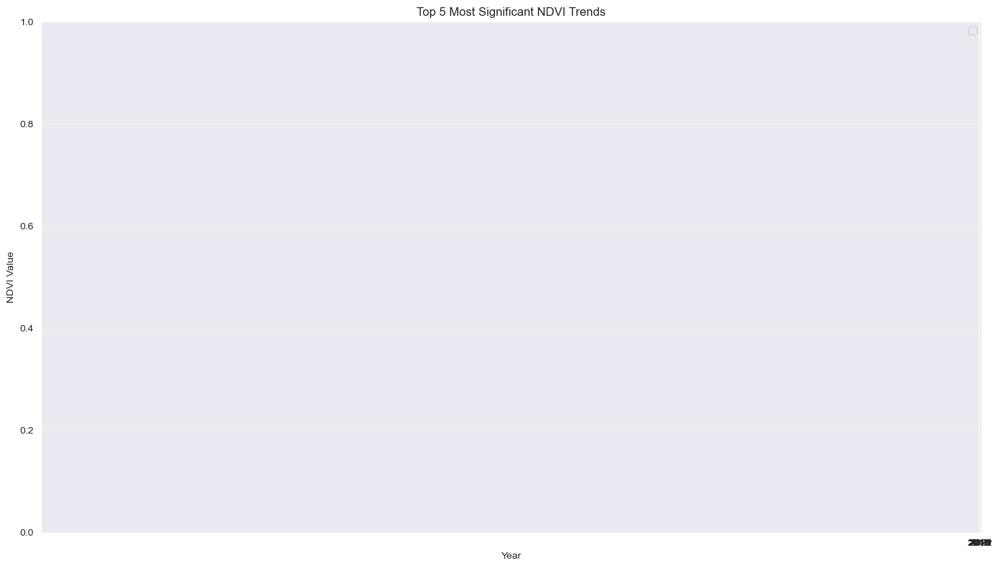

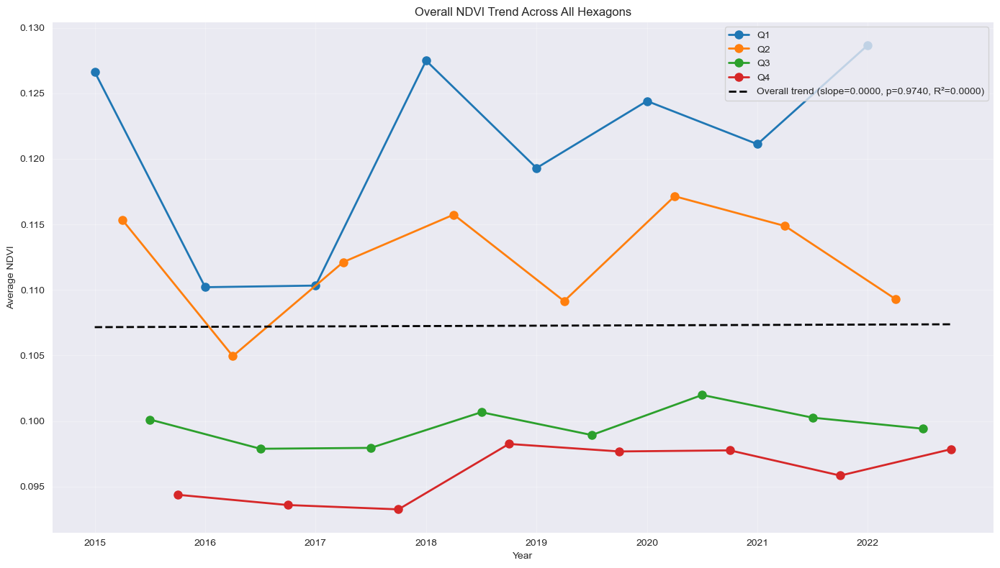

In [25]:
import geopandas as gpd
import pandas as pd
import numpy as np
import folium
import branca.colormap as cm
import json
from scipy import stats
import matplotlib.pyplot as plt
import os
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.dates as mdates
from datetime import datetime

def load_and_process_data(filepath):
    """
    Load and process the NDVI data from GeoJSON with a single regression line for all seasons
    """
    # Read the GeoJSON file
    gdf = gpd.read_file(filepath)

    # Select NDVI columns from 2015 onwards
    ndvi_columns = [
        col for col in gdf.columns
        if col.startswith('Q') and any(str(year) in col for year in range(2015, 2023))
    ]

    # Melt the dataframe to long format
    df_melted = gdf.drop(columns='geometry').melt(
        id_vars=['id', 'h3_address'],
        value_vars=ndvi_columns,
        var_name='season_year',
        value_name='ndvi'
    )

    # Extract season and year from the column name
    df_melted[['quarter', 'season', 'year']] = df_melted['season_year'].str.split('_', expand=True)
    df_melted['year'] = df_melted['year'].astype(int)

    # For fractional year values to account for quarters
    df_melted['quarter_num'] = df_melted['quarter'].str.replace('Q', '').astype(int)
    df_melted['year_fraction'] = df_melted['year'] + (df_melted['quarter_num'] - 1) / 4

    # Perform trend analysis with a single regression line for all seasons
    def calculate_trend(group):
        if len(group) < 2:
            return pd.Series({
                'slope': 0,
                'p_value': 1,
                'r_squared': 0,
                'avg_ndvi': group['ndvi'].mean() if len(group) > 0 else 0
            })
        # Use year_fraction for more precise time representation
        slope, intercept, r_value, p_value, std_err = stats.linregress(group['year_fraction'], group['ndvi'])
        return pd.Series({
            'slope': slope,
            'p_value': p_value,
            'r_squared': r_value**2,
            'avg_ndvi': group['ndvi'].mean()
        })

    # Group by id and calculate trend
    trends = df_melted.groupby('id').apply(calculate_trend).reset_index()

    # Merge trends back to geodataframe
    gdf = gdf.merge(trends, on='id')

    return gdf, df_melted

def create_interactive_map(gdf, df_melted):
    """
    Create an interactive map showing overall NDVI trends for hexagons
    """
    # Calculate the center of the map
    center = gdf.geometry.centroid.unary_union.centroid

    # Create a map
    m = folium.Map(location=[center.y, center.x], zoom_start=10)

    # Create a custom colormap for slopes
    def get_color(slope):
        # Create a colormap from red (negative) to white (neutral) to green (positive)
        colormap = cm.LinearColormap(
            colors=['red', 'white', 'green'],
            vmin=gdf['slope'].min(),
            vmax=gdf['slope'].max()
        )
        return colormap(slope)

    # Add base map layers
    folium.TileLayer('openstreetmap', name='OpenStreetMap').add_to(m)
    folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                     attr='Esri',
                     name='Satellite',
                     overlay=False,
                     control=True).add_to(m)

    # Create a single layer for overall NDVI trends
    layer = folium.FeatureGroup(name='Overall NDVI Trends')

    for idx, row in gdf.iterrows():
        # Create a GeoJSON for each hexagon
        geo_json = folium.GeoJson(
            row.geometry.__geo_interface__,
            style_function=lambda x, row=row: {
                'fillColor': get_color(row['slope']),
                'color': 'black',
                'weight': 2,
                'fillOpacity': 0.7
            },
            tooltip=folium.Tooltip(f"""
                Hexagon ID: {row['id']}<br>
                H3 Address: {row['h3_address']}<br>
                NDVI Slope: {row['slope']:.4f}<br>
                P-value: {row['p_value']:.4f}<br>
                R-squared: {row['r_squared']:.4f}<br>
                Average NDVI: {row['avg_ndvi']:.4f}
            """)
        )
        geo_json.add_to(layer)

    layer.add_to(m)

    # Add colormap legend
    colormap = cm.LinearColormap(
        colors=['red', 'white', 'green'],
        vmin=gdf['slope'].min(),
        vmax=gdf['slope'].max()
    )
    colormap.caption = 'Overall NDVI Trend Slope'
    colormap.add_to(m)

    # Add layer control
    folium.LayerControl().add_to(m)

    return m

def create_line_plots(gdf, df_melted):
    """
    Create line plots showing NDVI trends over time for each hexagon
    with a single regression line fitted to all data points
    """
    plots = []

    # Create a combined plot for the most significant trends
    top_significant = gdf[gdf['p_value'] < 0.05].sort_values(by='r_squared', ascending=False).head(5)

    # Set up a color map for different hexagons
    colors = plt.cm.viridis(np.linspace(0, 1, len(top_significant)))

    fig1 = plt.figure(figsize=(14, 8))

    for i, (idx, row) in enumerate(top_significant.iterrows()):
        hex_id = row['id']

        # Get data for this hexagon
        hex_data = df_melted[df_melted['id'] == hex_id].sort_values('year_fraction')

        # Create x values for the regression line
        x_range = np.linspace(hex_data['year_fraction'].min(), hex_data['year_fraction'].max(), 100)

        # Calculate the regression line values
        # y = mx + b
        y_fit = row['slope'] * x_range + (hex_data['ndvi'].mean() - row['slope'] * hex_data['year_fraction'].mean())

        # Plot scatter and line
        plt.scatter(hex_data['year_fraction'], hex_data['ndvi'], alpha=0.6, color=colors[i],
                    label=f"Hexagon {hex_id[:4]}... (slope={row['slope']:.4f})")
        plt.plot(x_range, y_fit, color=colors[i], linestyle='--')

    # Add labels and title
    plt.xlabel('Year')
    plt.ylabel('NDVI Value')
    plt.title('Top 5 Most Significant NDVI Trends')
    plt.grid(True, alpha=0.3)
    plt.legend()

    # Format x-axis to show years clearly
    years = sorted(df_melted['year'].unique())
    plt.xticks(years)
    plt.tight_layout()

    plots.append(fig1)

    # Create individual plots for significant hexagons
    # Limit to 5 plots to avoid generating too many
    significant_hexagons = gdf[gdf['p_value'] < 0.05].sort_values(by='r_squared', ascending=False).head(5)

    individual_plots = []
    for idx, row in significant_hexagons.iterrows():
        hex_id = row['id']
        h3_address = row['h3_address']

        # Create a new figure for each hexagon
        fig = plt.figure(figsize=(12, 6))

        # Get data for this hexagon
        hex_data = df_melted[df_melted['id'] == hex_id].sort_values('year_fraction')

        # Create scatter plot with different colors for different quarters
        for quarter in ['Q1', 'Q2', 'Q3', 'Q4']:
            quarter_data = hex_data[hex_data['quarter'] == quarter]
            plt.scatter(quarter_data['year_fraction'], quarter_data['ndvi'], alpha=0.7,
                        label=f"{quarter}", marker='o')

        # Create x values for the regression line
        x_range = np.linspace(hex_data['year_fraction'].min(), hex_data['year_fraction'].max(), 100)

        # Calculate the regression line values
        y_fit = row['slope'] * x_range + (hex_data['ndvi'].mean() - row['slope'] * hex_data['year_fraction'].mean())

        # Plot the regression line
        plt.plot(x_range, y_fit, color='black', linestyle='--',
                 label=f'Trend (slope={row["slope"]:.4f}, p={row["p_value"]:.4f}, R²={row["r_squared"]:.4f})')

        # Add labels and title
        plt.xlabel('Year')
        plt.ylabel('NDVI Value')
        plt.title(f'NDVI Trend for Hexagon {hex_id[:8]}... (H3: {h3_address[:8]}...)')
        plt.grid(True, alpha=0.3)
        plt.legend()

        # Format x-axis to show years clearly
        plt.xticks(years)
        plt.tight_layout()

        individual_plots.append(fig)

    plots.extend(individual_plots)

    # Create an overall average trend plot
    fig_overall = plt.figure(figsize=(14, 8))

    # Calculate average NDVI for each year and quarter
    yearly_avg = df_melted.groupby(['year', 'quarter'])['ndvi'].mean().reset_index()
    yearly_avg['year_fraction'] = yearly_avg['year'] + (yearly_avg['quarter'].str.replace('Q', '').astype(int) - 1) / 4

    # Plot each quarter with different colors
    for quarter in ['Q1', 'Q2', 'Q3', 'Q4']:
        quarter_data = yearly_avg[yearly_avg['quarter'] == quarter]
        plt.plot(quarter_data['year_fraction'], quarter_data['ndvi'], 'o-',
                 label=f"{quarter}", linewidth=2, markersize=8)

    # Calculate and plot the overall trend line
    x = yearly_avg['year_fraction']
    y = yearly_avg['ndvi']
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

    x_range = np.linspace(x.min(), x.max(), 100)
    y_fit = slope * x_range + intercept

    plt.plot(x_range, y_fit, 'k--', linewidth=2,
             label=f'Overall trend (slope={slope:.4f}, p={p_value:.4f}, R²={r_value**2:.4f})')

    # Add labels and title
    plt.xlabel('Year')
    plt.ylabel('Average NDVI')
    plt.title('Overall NDVI Trend Across All Hexagons')
    plt.grid(True, alpha=0.3)
    plt.legend()

    # Format x-axis to show years clearly
    plt.xticks(years)
    plt.tight_layout()

    plots.append(fig_overall)

    print(f"Created {len(plots)} line plots")
    return plots

def main(filepath):
    # Load and process data
    gdf, df_melted = load_and_process_data(filepath)

    # Create interactive map
    map_obj = create_interactive_map(gdf, df_melted)

    # Create line plots
    plots = create_line_plots(gdf, df_melted)

    # Provide some statistical summary
    print("Overall NDVI Trend Analysis Summary:")
    print(gdf[['slope', 'p_value', 'r_squared', 'avg_ndvi']].describe())

    # Count of significant trends
    significant_trends = gdf[gdf['p_value'] < 0.05]
    print("\nSignificant Trends:")
    print(f"Total significant trends: {len(significant_trends)}")
    print("Positive significant trends:", len(significant_trends[significant_trends['slope'] > 0]))
    print("Negative significant trends:", len(significant_trends[significant_trends['slope'] < 0]))

    return gdf, df_melted, map_obj, plots

# Run the analysis
gdf, df_melted, map_obj, plots = main('/Users/santi/DataspellProjects/Lithium-Jakob/Data/lithium_ndvi_seasonal.geojson')

# Display plots
plt.show()  # This will display all the plots interactively

In [26]:
map_obj

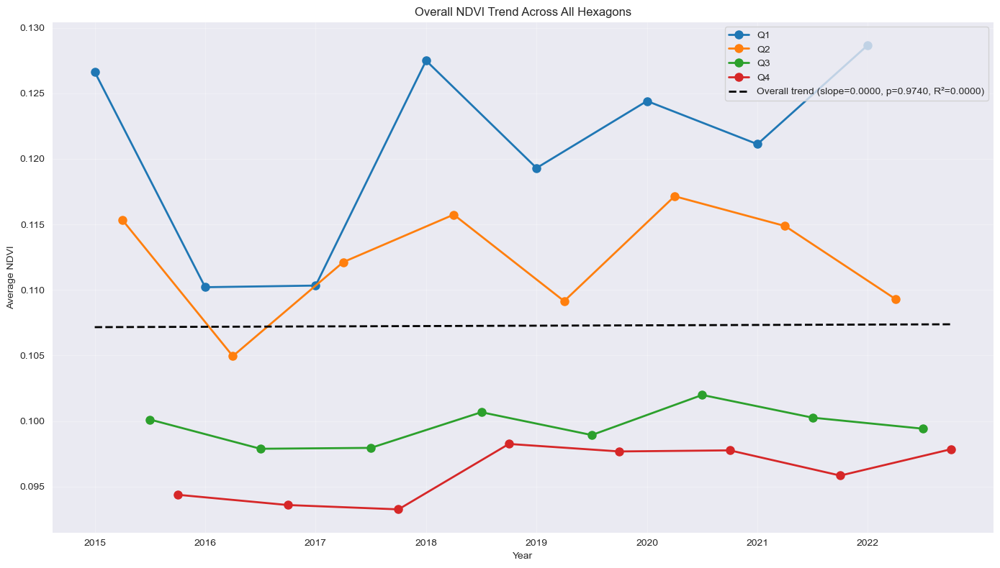

In [30]:
plots[1]